# Exploration des données challenges Rakuten

In [1]:
import pandas as pd
import plotly.express as px
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np

## Fichers fournis
- X_train.csv: training input file (212,659 lignes)
- Y_train.csv: training output file (212,659 lignes)
- X_test.csv: test input file (37,347 lignes)
- images.zip: file containing all the images

In [3]:
X_train = pd.read_csv("data/X_train.csv")
y_train = pd.read_csv("data/y_train.csv")

features = ["image_file_name","item_name","item_caption"]
target = "color_tags"

train = pd.merge(X_train,y_train)
test = pd.read_csv("data/X_test.csv",usecols=features)
train = train[features+[target]]
train = train.apply(lambda x: x.str.strip().replace({'':np.nan}))
test = test.apply(lambda x: x.str.strip().replace({'':np.nan}))

train["color_tags"] = train["color_tags"].str.strip("[']").str.split("', '")
train.head()

,image_file_name,item_name,item_caption,color_tags
0,278003_10389968_1.jpg,三協アルミ M.シェード2 梁置きタイプ 片側支持 5818 H30 ポリカーボネート屋根 ...,商品番号19235601メーカー三協アルミサイズ幅 1931.0mm × 奥行き 5853....,"[Silver, Grey, Black]"
1,220810_10010506_1.jpg,【40%OFF SALE/セール】30代〜40代 ファッション コーディネート 太サッシュ ...,太サッシュベルトで存在感アップ 柔軟性に優れた馬革を使用 幅が太めで存在感◎ キレイな形が出...,"[Brown, Black]"
2,207456_10045549_1.jpg,下駄 桐 日本製 女性用 TONE 鼻緒巾が広め 黒塗り台 適合足サイズ 23〜24.5cm...,項目 桐の下駄 ※特別価格にて浴衣、半幅帯（浴衣帯）、巾着等も同時出品中です！ サイズ 下駄...,"[White, Black]"
3,346541_10000214_1.jpg,＼期間限定【1000円OFF】クーポン 発行中／ シューズボックス 幅60 奥行33 15足...,■商品説明 ルーバーシューズボックス60幅のシングルタイプが登場。お部屋に合わせて色、サイズ...,"[Beige, Brown, Black]"
4,240426_10024071_1.jpg,ポスト 郵便ポスト 郵便受け 集合住宅用ポスト 可変式プッシュ錠集合郵便受箱 PKS-M15...,集合住宅用ポスト 可変式プッシュ錠集合郵便受箱 PKS-M15-3 1列3段 暗証番号を自由...,[Silver]


## Descriptions des variables 

Variables prédictives (X_train.csv et X_test.csv):
- image_file_name (str): nom de l'image dans images.zip
- item_name (str): nom de l'article en japonais
- item_caption (str): description de l'article en japonais (champs comportant des NAs)

Variable à prédire (Y_train.csv):
- color_tags (liste): différentes couleurs asocciées à l'article

In [3]:
# Répartition des données manquantes
train.isna().sum()

image_file_name        0
item_name              0
item_caption       23974
color_tags             0
dtype: int64

In [4]:
test.isna().sum()

image_file_name       0
item_name             0
item_caption       4254
dtype: int64

## 1. X_train.csv

### 1.1 Longueur des descriptions d'article

<AxesSubplot:>

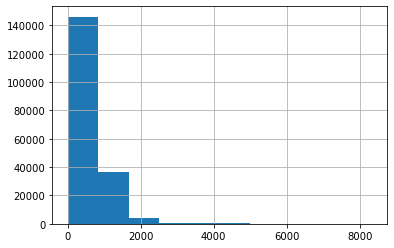

In [5]:
# Nombre de caractères
caption = train["item_caption"].dropna().apply(lambda x: len(x))
fig = px.histogram(caption)
fig.show()
caption.hist()

La majorité des descriptions d'articles contient moins de 1000 caractères.

### 1.2 Longueur des noms d'articles

<AxesSubplot:>

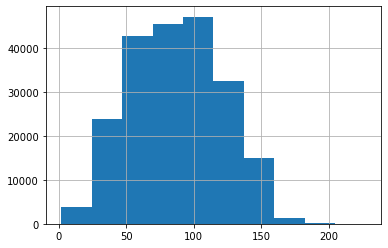

In [6]:
# Nombre de caractères
name = train["item_name"].dropna().apply(lambda x: len(x))
fig = px.histogram(name,marginal='box')
fig.show()
name.hist()

La majorité des titres d'articles comportent moins de 100 caractères.

### 1.3 Images des articles

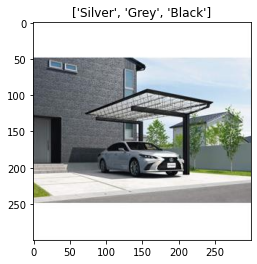

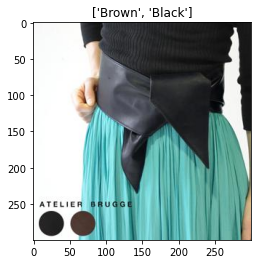

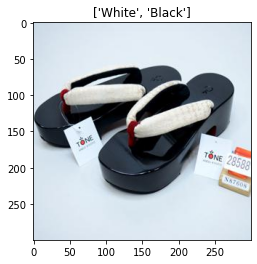

In [7]:
# Function that read and display an image
def read_display(index):
    img   = cv.imread(filename=f"data/images/{train.loc[index, 'image_file_name']}")
    label = train.loc[index, 'color_tags']

    if img is not None:
        colored = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        plt.imshow(colored)
        plt.title(str(label))
        plt.show()

# Example
for i in range(3):
    read_display(i)

Les images d'articles comportent des fonds colorés interférant avec la prédiction de la couleurs des objets.

## 2. Y_train.csv

### 2.1 Nombres de couleurs différentes

In [8]:
color = []
for i in train.index:
    color += train["color_tags"][i]
color=set(color)
print("Nombre de couleurs: ",len(color))
color

Nombre de couleurs:  19


{'Beige',
 'Black',
 'Blue',
 'Brown',
 'Burgundy',
 'Gold',
 'Green',
 'Grey',
 'Khaki',
 'Multiple Colors',
 'Navy',
 'Orange',
 'Pink',
 'Purple',
 'Red',
 'Silver',
 'Transparent',
 'White',
 'Yellow'}

### 2.2 Proportion d'articles par couleur

<AxesSubplot:>

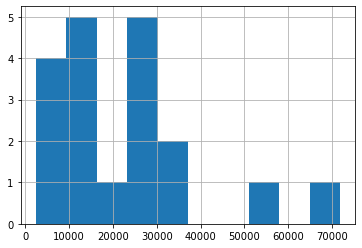

In [9]:
color_repartition = dict([(k,0) for k in color])
for tags in train["color_tags"]:
    for c in tags:
        color_repartition[c]+=1
Colors = pd.DataFrame(columns=['colors','proportion'])
Colors["colors"] = color_repartition.keys()
Colors["proportion"] = color_repartition.values()
fig = px.pie(Colors,'colors','proportion')
fig.show()
Colors["proportion"].hist()

Nombre d'articles par couleurs déséquilibrés. Certaines couleurs comme le noir ou le blanc sont sur-représenté alors que d'autre le sont très peu.

### 2.3 Nombre de tag par articles

<AxesSubplot:>

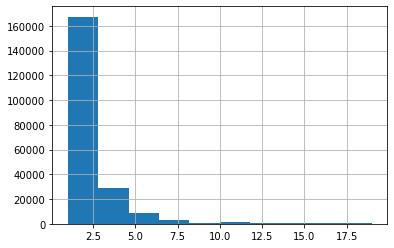

In [10]:
tag_number = train["color_tags"].apply(lambda x: len(x))
fig = px.histogram(tag_number)
fig.show()
tag_number.hist()

Les articles peuvent avoir plusieurs tag couleurs (entre 1 et 19). La majorité des articles ont moins de 5 tags.